# Neural Network Project

<a id="part1"></a>
## Part 1: Deep L-Layer Neural Network for Image Classification

You will use the functions given to you to build a deep L-layer network, and apply it to cat vs non-cat classification. Hopefully, you will see an improvement in accuracy relative to your previous logistic regression implementation.  

### 1.1 - Packages

Let's first import all the packages that you will need during this assignment. 
- [numpy](https://www.numpy.org/) is the fundamental package for scientific computing with Python.
- [matplotlib](http://matplotlib.org) is a library to plot graphs in Python.
- [h5py](http://www.h5py.org) is a common package to interact with a dataset that is stored on an H5 file.
- [PIL](https://pillow.readthedocs.io/en/stable/index.html) and [scipy](https://www.scipy.org/) are used here to test your model with your own picture at the end.
- nn_functions provides the functions you need to build an L-layer network.
- np.random.seed(1) is used to keep all the random function calls consistent. It will help us grade your work.

In [1]:
import time
import numpy as np
import h5py
import matplotlib.pyplot as plt
import scipy
from PIL import Image
from scipy import ndimage
from nn_functions import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (5.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

np.random.seed(1)

### 1.2 - Dataset

You will use the same "Cat vs non-Cat" dataset as in your previous assignment. The model you had built had 70% test accuracy on classifying cats vs non-cats images. Hopefully, your new model will perform a better!

**Problem Statement**: You are given a dataset containing:
- a training set of m_train images labelled as cat (1) or non-cat (0)
- a test set of m_test images labelled as cat and non-cat
- each image is of shape (num_px, num_px, 3) where 3 is for the 3 channels (RGB).

Let's get more familiar with the dataset. Load the data by running the cell below.

In [2]:
train_x_orig, train_y, test_x_orig, test_y, classes = load_data()

The following code will show you an image in the dataset. Feel free to change the index and re-run the cell multiple times to see other images. 

y = 1. It's a cat picture.


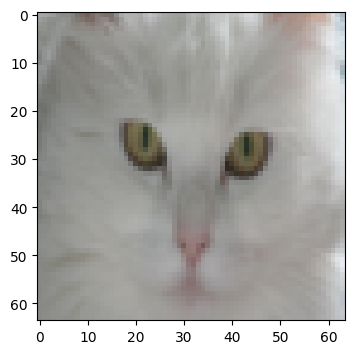

In [3]:
# Example of a picture
index = 50
plt.imshow(train_x_orig[index])
print ("y = " + str(train_y[0,index]) + ". It's a " + classes[train_y[0,index]].decode("utf-8") +  " picture.")

In [4]:
# Explore your dataset 
m_train = train_x_orig.shape[0]
num_px = train_x_orig.shape[1]
m_test = test_x_orig.shape[0]

print ("Number of training examples: " + str(m_train))
print ("Number of testing examples: " + str(m_test))
print ("Each image is of size: (" + str(num_px) + ", " + str(num_px) + ", 3)")
print ("train_x_orig shape: " + str(train_x_orig.shape))
print ("train_y shape: " + str(train_y.shape))
print ("test_x_orig shape: " + str(test_x_orig.shape))
print ("test_y shape: " + str(test_y.shape))

Number of training examples: 209
Number of testing examples: 50
Each image is of size: (64, 64, 3)
train_x_orig shape: (209, 64, 64, 3)
train_y shape: (1, 209)
test_x_orig shape: (50, 64, 64, 3)
test_y shape: (1, 50)


As usual, you reshape and standardize the images before feeding them to the network. The code is given in the cell below.

<img src="images/imvectorkiank.png" style="width:450px;height:300px;">

<caption><center> <u>Figure 1</u>: Image to vector conversion. <br> </center></caption>

In [5]:
# Reshape the training and test examples 
train_x_flatten = train_x_orig.reshape(train_x_orig.shape[0], -1).T   # The "-1" makes reshape flatten the remaining dimensions
test_x_flatten = test_x_orig.reshape(test_x_orig.shape[0], -1).T

# Standardize data to have feature values between 0 and 1.
train_x = train_x_flatten/255.
test_x = test_x_flatten/255.

print ("train_x's shape: " + str(train_x.shape))
print ("test_x's shape: " + str(test_x.shape))


train_x's shape: (12288, 209)
test_x's shape: (12288, 50)


$12,288$ equals $64 \times 64 \times 3$ which is the size of one reshaped image vector.

### 1.3 - Architecture of your model

Now that you are familiar with the dataset, it is time to build a deep neural network to distinguish cat images from non-cat images.

Here is a simplified network representation for an L-layer neural network:

<img src="images/LlayerNN_kiank.png" style="width:650px;height:400px;">
<caption><center> <u>Figure 2</u>: L-layer neural network.</center></caption> 

The model can be summarized as: ***[LINEAR -> RELU] $\times$ (L-1) -> LINEAR -> SIGMOID***</center></caption>

<u>Detailed Architecture of figure 2</u>:
- The input is a (64,64,3) image which is flattened to a vector of size (12288,1).
- The corresponding vector: $[x_0,x_1,...,x_{12287}]^T$ is then multiplied by the weight matrix $W^{[1]}$ and then you add the intercept $b^{[1]}$. The result is called the linear unit.
- Next, you take the relu of the linear unit. This process could be repeated several times for each $(W^{[l]}, b^{[l]})$ depending on the model architecture.
- Finally, you take the sigmoid of the final linear unit. If it is greater than 0.5, you classify it to be a cat.

<u>General methodology</u>

As usual you will follow the Deep Learning methodology to build the model:
1. Initialize parameters / Define hyperparameters
2. Loop for num_iterations:
    - Forward propagation
    - Compute cost function
    - Backward propagation
    - Update parameters (using parameters, and grads from backprop) 
4. Use trained parameters to predict labels

### 1.4 - L-layer Neural Network

**Exercise**: Use the helper functions in the nn_functions file to build an $L$-layer neural network with the following structure: **[LINEAR -> RELU]$\times$(L-1) -> LINEAR -> SIGMOID**. Spend some time looking through the functions and understanding how they can be used to build a deep neural network. The functions you may need and their inputs are:
```python
def initialize_parameters_deep(layers_dims):
    ...
    return parameters 
def L_model_forward(X, parameters):
    ...
    return AL, caches
def compute_cost(AL, Y):
    ...
    return cost
def L_model_backward(AL, Y, caches):
    ...
    return grads
def update_parameters(parameters, grads, learning_rate):
    ...
    return parameters
```

In [6]:
### CONSTANTS ###
layers_dims = [12288, 20, 7, 5, 1] #  4-layer model

In [7]:
# GRADED FUNCTION: L_layer_model

def L_layer_model(X, Y, layers_dims, learning_rate = 0.0075, num_iterations = 3000, print_cost=False):
    """
    Implements a L-layer neural network: [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID.
    
    Arguments:
    X -- data, numpy array of shape (num_px * num_px * 3, number of examples)
    Y -- true "label" vector (containing 0 if cat, 1 if non-cat), of shape (1, number of examples)
    layers_dims -- list containing the input size and each layer size, of length (number of layers + 1).
    learning_rate -- learning rate of the gradient descent update rule
    num_iterations -- number of iterations of the optimization loop
    print_cost -- if True, it prints the cost every 100 steps
    
    Returns:
    parameters -- parameters learnt by the model. They can then be used to predict.
    """

    np.random.seed(1)
    costs = []                         # keep track of cost
    
    # Parameters initialization. (≈ 1 line of code)
    ### START CODE HERE ###
    parameters = initialize_parameters_deep(layers_dims)

    ### END CODE HERE ###
    
    # Loop (gradient descent)
    for i in range(0, num_iterations):

        # START CODE HERE ### (≈ 4 lines of code)
        # Forward propagation: [LINEAR -> RELU]*(L-1) -> LINEAR -> SIGMOID.
        AL, caches = L_model_forward(X, parameters)
        
        # Compute cost.
        cost = compute_cost(AL, Y)
    
        # Backward propagation.
        grads = L_model_backward(AL, Y, caches)
 
        # Update parameters.
        parameters = update_parameters(parameters, grads, learning_rate)


        ### END CODE HERE ###
                
        # Print the cost every 100 training example
        if print_cost and i % 100 == 0:
            print ("Cost after iteration %i: %f" %(i, cost))
        if print_cost and i % 100 == 0:
            costs.append(cost)
            
    # plot the cost
    plt.plot(np.squeeze(costs))
    plt.ylabel('cost')
    plt.xlabel('iterations (per hundreds)')
    plt.title("Learning rate =" + str(learning_rate))
    plt.show()
    
    return parameters

You will now train the model as a 4-layer neural network. 

Run the cell below to train your model. The cost should decrease on every iteration. It may take a few minutes to run 2500 iterations. 

Cost after iteration 0: 0.771749
Cost after iteration 100: 0.672053
Cost after iteration 200: 0.648263
Cost after iteration 300: 0.611507
Cost after iteration 400: 0.567047
Cost after iteration 500: 0.540138
Cost after iteration 600: 0.527930
Cost after iteration 700: 0.465477
Cost after iteration 800: 0.369126
Cost after iteration 900: 0.391747
Cost after iteration 1000: 0.315187
Cost after iteration 1100: 0.272700
Cost after iteration 1200: 0.237419
Cost after iteration 1300: 0.199601
Cost after iteration 1400: 0.189263
Cost after iteration 1500: 0.161189
Cost after iteration 1600: 0.148214
Cost after iteration 1700: 0.137775
Cost after iteration 1800: 0.129740
Cost after iteration 1900: 0.121225
Cost after iteration 2000: 0.113821
Cost after iteration 2100: 0.107839
Cost after iteration 2200: 0.102855
Cost after iteration 2300: 0.100897
Cost after iteration 2400: 0.092878


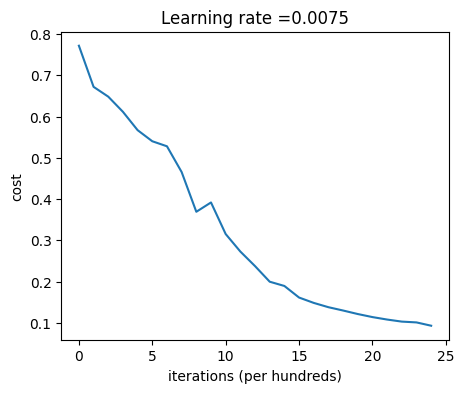

In [8]:
parameters = L_layer_model(train_x, train_y, layers_dims, num_iterations = 2500, print_cost = True)

In [9]:
pred_train = predict(train_x, train_y, parameters)

Accuracy: 0.9856459330143539


In [10]:
pred_test = predict(test_x, test_y, parameters)

Accuracy: 0.8


Congratulations! It seems that your 4-layer neural network has better performance than your previous assignment network on the same test set. 

This is good performance for this task.

###  1.5 - Results Analysis

First, let's take a look at some images the L-layer model labeled incorrectly. This will show a few mislabeled images. 

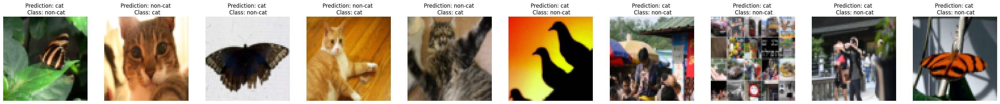

In [11]:
print_mislabeled_images(classes, test_x, test_y, pred_test)

**A few types of images the model tends to do poorly on include:** 
- Cat body in an unusual position
- Cat appears against a background of a similar color
- Unusual cat color and species
- Camera Angle
- Brightness of the picture
- Scale variation (cat is very large or small in image) 

### 1.6 - Test with your own image (optional/ungraded exercise) ##

You can use your own image and see the output of your model. To do that:
1. Add your image to the "images" folder
2. Change your image's name in the following code
3. Run the code and check if the algorithm is right (1 = cat, 0 = non-cat)!

Accuracy: 1.0
y = 0.0, your L-layer model predicts a "non-cat" picture.


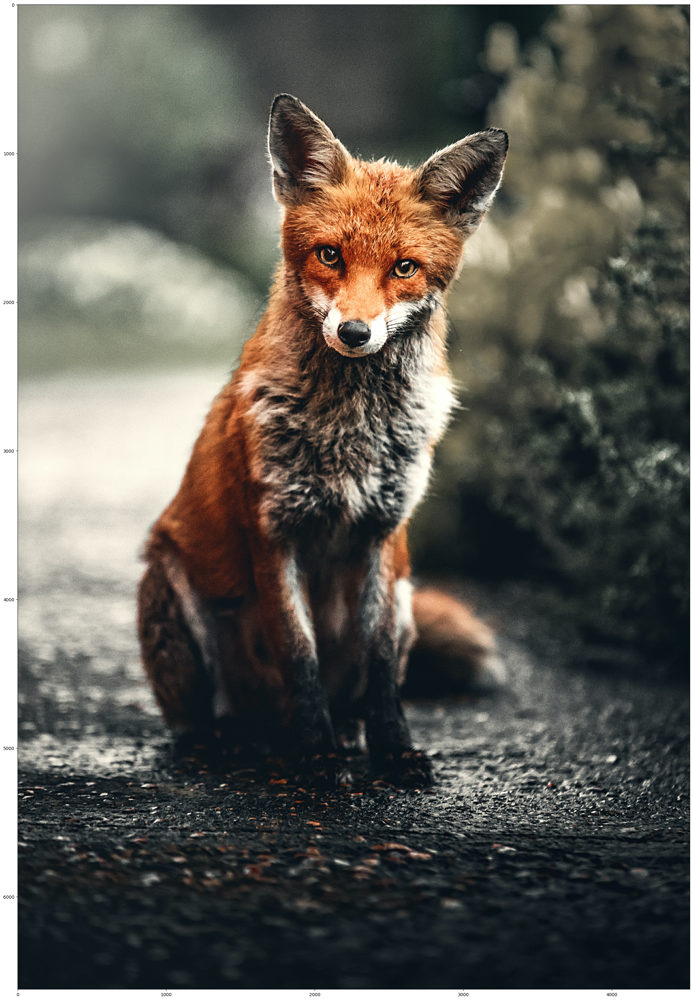

In [13]:
## START CODE HERE ##
my_image = "fox.jpg" # change this to the name of your image file 
my_label_y = [0] # the true class of your image (1 -> cat, 0 -> non-cat)
## END CODE HERE ##

fname = "images/" + my_image
image = Image.open(fname)
my_image = np.array(image.resize((num_px, num_px))).reshape((1, num_px*num_px*3)).T
my_image = my_image/255.
my_predicted_image = predict(my_image, my_label_y, parameters)

plt.imshow(image)
print ("y = " + str(np.squeeze(my_predicted_image)) + ", your L-layer model predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

<a id="part2"></a>
## Part 2: Full Machine Learning Project

Now you will use all you know about building and training neural networks in an "idea, code, experiment" cycle on a data set.

### 2.1 - Find a dataset (or datasets)

Find an appropriate dataset to work with. Some places to look:
- [Kaggle](https://www.kaggle.com/datasets) 
- [University of California, Irvine Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets.php)

You can choose just one, or more than one if you'd like to. Think carefully of the type of task you are trying to accomplish (e.g., classification, regression, etc.). Spend some time analyzing and processing the data. For example, decide how to split the data; should you have separate train, dev, and test sets? Does the data need to be cleaned or adjusted? How should the data be normalized? Any other considerations or adjustments needed for the data?

Clearly indicate where you found the dataset(s) you are working with.

Show the work you have done analyzing and processing the data in Python boxes in this notebook. There should also be associated markdown boxes discussing what you have observed and what decisions you have made.




# About the data:
#### The data consists of cats (represented by 0) and dogs (represented by 1) images in two different folders named 'cats' and 'dogs' respectively. The data was chosen taken from https://www.kaggle.com/datasets/samuelcortinhas/cats-and-dogs-image-classification. 
#### The original data consisted of two different batches of pictures - train and test batch, but the pictures were moved manually to form a single batch inorder to perform normalization on the whole data set by converting the images to numpy array and then dividing each value by 255.
#### After converting and performing normalization the data was divided into train, dev (development) and test batches.

In [1]:
# Importing the required libraries and functions
import numpy as np
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D 
from tensorflow.keras.optimizers import Adam 
from tensorflow.keras.metrics import categorical_crossentropy 
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from sklearn.metrics import confusion_matrix 
import itertools 
import os 
import shutil 
import random 
import glob
import matplotlib.pyplot as plt 
import warnings 
warnings.simplefilter(action='ignore', category=FutureWarning) 
%matplotlib inline

2023-04-17 20:32:07.635105: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Import the images
data = tf.keras.utils.image_dataset_from_directory('/Users/vsharika/Desktop/Neural_Network_Project/data')
# PLEASE CHANGE THE DIRECTORY TO YOUR CURRENT DIRECTORY BEFORE RUNNING THE CODE.

Found 696 files belonging to 2 classes.


In [4]:
# Scale the data
data = data.map(lambda x,y: (x/255, y))

In [10]:
# Get the total number batches
len(data)

22

In [18]:
# Assign the number of batches to train, dev and test datasets 
train_data_size = int(len(data)*0.8) # = 17 batches
dev_data_size = int(len(data)*0.1) + 1 # = 3 batches
test_data_size = int(len(data)*0.1) # = 2 batches

In [22]:
# Divide the data set to train, dev and test datasets according the assigned sizes
train_data = data.take(train_data_size)
dev_data = data.skip(train_data_size).take(dev_data_size)
test_data = data.skip(train_data_size + dev_data_size).take(test_data_size)

#### The dataset contains 696 total images (348 each for cats and dogs). The whole dataset is divided into 22 batches of 32 images each. The 22 batches are then divided as follows:
#### - 17 batches for training data
#### - 3 batches for development data
#### - 2 batches for test data

### 2.2 - Build your model

Start with a basic model, show the results, and then apply whichever improvements you decide to incorporate as per below.

You have two options for building your model:
- **The difficult option**: Use the provided L-layer network code used above in Part 1 and (later) extend it to incorporate more advanced neural network improvements as given in class
- **The easier option**: Use [Keras](https://keras.io) and [TensorFlow](https://www.tensorflow.org) to build a network
	- You may *not* use any framework other than Keras/TensorFlow

Ambition will be rewarded! If you choose the easier option, you are expected to incorporate more of the potential improvements given below.

Some of the neural network improvements you can consider incorporating for either option (not an exhaustive list):
- Weight initialization methods (e.g., zeroes, random, etc.)
- Regularization: L2, dropout, etc.
- Mini-batch gradient descent
- Gradient descent optimization algorithm: momentum, RMSProp, Adam, etc.
- Batch normalization

Show the results with your model with improvements. Use markdown boxes to discuss the effect of your improvement(s) and change in accuracy.

#### After processing the data we build a simple sequential model using built in Keras functions, the first iteration of the model contains 2 convolutional layers, 2 maxpool layers, 1 layer to flatten the data, 1 fully connected dense layer and 1 output layer. 
#### The input layer takes in the images in the form of numpy arrays of size (256, 256, 3), and the output layer give 0 if the image is of a cat and 1 if the image is of a dog.

In [60]:
# Your work for building a basic model and then applying improvements

# Build the model
model = Sequential([
    Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
    MaxPool2D(pool_size=(2, 2), strides=1),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPool2D(pool_size=(2, 2), strides=1),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(units=1, activation='sigmoid'),
])

#### After building the model we compile it using the built in Keras function, we use the Adam optimizer as it provides us with benefits of both the SGD and RMSProp, and the learning rate is set to 0.0075, the loss function we choose is binary cross-entropy as our output has only two values either 0 or 1.

In [61]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0075),
              loss='binary_crossentropy', 
              metrics=['accuracy']
             )

In [62]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 255, 255, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 255, 255, 32)      4640      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 254, 254, 32)     0         
 g2D)                                                            
                                                                 
 flatten_6 (Flatten)         (None, 2064512)           0         
                                                                 
 dense_12 (Dense)            (None, 64)               

#### Then we fit our model with the training data and validation data to check for bias or variance, the number of epochs is set to 5 to train the data well.

In [63]:
# Fit the model
model.fit(x=train_data, 
          validation_data=dev_data, 
          epochs=5, 
          verbose=2
         )

Epoch 1/5
17/17 - 59s - loss: 166.2655 - accuracy: 0.5000 - val_loss: 0.6907 - val_accuracy: 0.4792 - 59s/epoch - 3s/step
Epoch 2/5
17/17 - 54s - loss: 0.6933 - accuracy: 0.5018 - val_loss: 0.6925 - val_accuracy: 0.5104 - 54s/epoch - 3s/step
Epoch 3/5
17/17 - 44s - loss: 0.6929 - accuracy: 0.5184 - val_loss: 0.6912 - val_accuracy: 0.5625 - 44s/epoch - 3s/step
Epoch 4/5
17/17 - 43s - loss: 0.6912 - accuracy: 0.5018 - val_loss: 0.6680 - val_accuracy: 0.5104 - 43s/epoch - 3s/step
Epoch 5/5
17/17 - 44s - loss: 0.6698 - accuracy: 0.5846 - val_loss: 0.6524 - val_accuracy: 0.6354 - 44s/epoch - 3s/step


In [64]:
predictions = model.predict(x=test_data, verbose=0)

In [65]:
accuracy = model.evaluate(test_data, verbose=2)

2/2 - 3s - loss: 0.6402 - accuracy: 0.6786 - 3s/epoch - 2s/step


In [66]:
print('Test accuracy:', accuracy[1]*100, '%')

Test accuracy: 67.85714030265808 %


#### The model has a accuracy of about 68%, and according to the output the loss values are on the higher side and there is about a 5% difference between the results for training data and development data.

### 2.3 - Idea, Code, Experiment Cycle

Now go through a iterative process to improve your model. This will involve things like (not an exhaustive list):
- Checking whether you have a bias and/or variance problem. How will you address it? 
- Hyperparameter tuning: learning rate, # of layers, # of hidden units, activation functions, mini-batch size, etc.
- Trying any of the improvements made to the model in part 2.2 to see if it leads to better results

We want to see the progression of your model to a final version with the best results you can achieve. You don't have to show results for every single experiment you tried, but a general progression of different models at various stages of development should be included. Feel free to include discussion, diagrams, tables, and/or graphs that may summarize some of your experiments. **If you only show us the final model you've built, your mark will be minimal**.

Your discussion should also include details on the methodology you used in your experiments. For example, how did you approach hyperparameter tuning?


#### To fix the model, get better results and prevent any sort of bias or variance, we added 1 more convolutional layer and 1 more maxpool layer and also adjusted the number of filters for all the layers.

In [50]:
# Your work for experiments

# Build the model
improved_model = Sequential([
    Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same', input_shape=(256, 256, 3)),
    MaxPool2D(pool_size=(2, 2), strides=1),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPool2D(pool_size=(2, 2), strides=1),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPool2D(pool_size=(2, 2), strides=1),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(units=1, activation='sigmoid'),
])

In [51]:
improved_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 255, 255, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 255, 255, 32)      4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 254, 254, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 254, 254, 64)      18496     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 253, 253, 64)    

#### I also tried multiple different values for the learning rate such as 0.0001 and 0.005 but the accuracy reamined just around 60% for those values so I decided to go with 0.001 as it gave me the best results.

In [52]:
improved_model.compile(optimizer=Adam(learning_rate=0.001), 
                       loss='binary_crossentropy', 
                       metrics=['accuracy']
                      )

In [53]:
improved_model.fit(x=train_data, 
                   validation_data=dev_data, 
                   epochs=10, 
                   verbose=2
                  )

Epoch 1/10
17/17 - 269s - loss: 25.4166 - accuracy: 0.4596 - val_loss: 0.7190 - val_accuracy: 0.5417 - 269s/epoch - 16s/step
Epoch 2/10
17/17 - 226s - loss: 0.6690 - accuracy: 0.6250 - val_loss: 0.5794 - val_accuracy: 0.7292 - 226s/epoch - 13s/step
Epoch 3/10
17/17 - 243s - loss: 0.4827 - accuracy: 0.7665 - val_loss: 0.4204 - val_accuracy: 0.8021 - 243s/epoch - 14s/step
Epoch 4/10
17/17 - 255s - loss: 0.3572 - accuracy: 0.8640 - val_loss: 0.1905 - val_accuracy: 0.9583 - 255s/epoch - 15s/step
Epoch 5/10
17/17 - 258s - loss: 0.1809 - accuracy: 0.9449 - val_loss: 0.1686 - val_accuracy: 0.9375 - 258s/epoch - 15s/step
Epoch 6/10
17/17 - 247s - loss: 0.0923 - accuracy: 0.9743 - val_loss: 0.0535 - val_accuracy: 0.9896 - 247s/epoch - 15s/step
Epoch 7/10
17/17 - 256s - loss: 0.0327 - accuracy: 0.9945 - val_loss: 0.0984 - val_accuracy: 0.9688 - 256s/epoch - 15s/step
Epoch 8/10
17/17 - 277s - loss: 0.0324 - accuracy: 0.9926 - val_loss: 0.0632 - val_accuracy: 0.9688 - 277s/epoch - 16s/step
Epoch 9

In [54]:
predictions = improved_model.predict(x=test_data, verbose=0)

In [55]:
improved_accuracy = improved_model.evaluate(test_data, verbose=2)

2/2 - 5s - loss: 0.0789 - accuracy: 1.0000 - 5s/epoch - 2s/step


In [56]:
print('Test accuracy:', improved_accuracy[1]*100, '%')

Test accuracy: 100.0 %
